In [36]:
import torch
import torch.nn.functional as F
from torchvision.transforms import InterpolationMode
import pandas as pd
import numpy as np
import os
from torchvision import transforms
from PIL import Image
from torch.utils.data import DataLoader
import torch
import cv2
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from src.Models import (CancerClassifierResNet18, CancerClassifierResNet50, TimmEfficientNet, 
                        CancerClassifierCoaTLiteTiny, CancerClassifierSwinTiny, CancerClassifierConvNeXTTiny)


In [2]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMG_DIR = Path("/media/lak_05/Windows-SSD/ML/PathoDetect/Data/test")
CSV_PATH = Path("/media/lak_05/Windows-SSD/ML/PathoDetect/Data/test_labels.csv")

In [3]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

def load_image(img_path):
    image = Image.open(img_path).convert("RGB")
    tensor = transform(image).to(DEVICE)
    return image, tensor

def load_model(cls, weights_path):
    model = cls()
    checkpoint = torch.load(weights_path, map_location=DEVICE, weights_only=False)
    state_dict = {k.replace("base_model.", "base."): v for k, v in checkpoint["model_state"].items()}
    model.load_state_dict(state_dict)
    model.to(DEVICE).eval()
    return model

def load_effnet_model(weights_path):
    model = TimmEfficientNet()
    if weights_path is not None:
        checkpoint = torch.load(weights_path, map_location=DEVICE, weights_only=False)
        if "model_state" in checkpoint:
            model.load_state_dict(checkpoint["model_state"])
        else:
            model.load_state_dict(checkpoint)
    model.to(DEVICE).eval()
    return model

def load_transformer_model(cls, weights_path):
    model = cls(pretrained=False)
    checkpoint = torch.load(weights_path, map_location=DEVICE, weights_only=False)
    if "model_state" in checkpoint:
        model.load_state_dict(checkpoint["model_state"])
    else:
        model.load_state_dict(checkpoint)
    model.to(DEVICE).eval()
    return model

df = pd.read_csv(CSV_PATH)

transform = transforms.Compose([
    transforms.Resize((224, 224), interpolation=InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def get_image_tensor_and_label(row):
    img_path = os.path.join(IMG_DIR, row["filename"])
    label = int(row["label"])

    img = Image.open(img_path).convert("RGB")
    image_tensor = transform(img).unsqueeze(0).to(DEVICE)

    return image_tensor, label

MODELS = {
    "ResNet18": {
        "model": lambda: load_model(CancerClassifierResNet18, "/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/ResNet18.pth"),
        "target_layer": lambda model: model.base.layer4[-1],
        "threshold": 0.28
    },
    "ResNet50": {
        "model": lambda: load_model(CancerClassifierResNet50, "/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/ResNet50.pth"),
        "target_layer": lambda model: model.base.layer4[-1],
        "threshold": 0.29
    },
    "EffNetB0": {
        "model": lambda: load_effnet_model("/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/EfficientNetB0.pth"),
        "target_layer": lambda model: model.backbone.conv_head,
        "threshold": 0.25
    },
    "CoaTLiteTiny": {
    "model": lambda: load_transformer_model(
        CancerClassifierCoaTLiteTiny,
        "/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/CoaTLite.pth"
    ),
    "target_layer": lambda model: model.base_model.serial_blocks4[-1].factoratt_crpe, 
    "threshold": 0.19
    },
    "SwinTiny": {
        "model": lambda: load_transformer_model(CancerClassifierSwinTiny, "/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/SwinTiny.pth"),
        "target_layer": lambda model: model.base_model.layers[3].blocks[1].norm1,
        "threshold": 0.28
    },
    "ConvNeXTTiny": {
    "model": lambda: load_transformer_model(
        CancerClassifierConvNeXTTiny,
        "/media/lak_05/Windows-SSD/ML/PathoDetect/Final_Models/ConvNext.pth"
    ),
    "target_layer": lambda model: model.base_model.stages[-1].blocks[-1].conv_dw,
    "threshold": 0.199999999996
}
}

In [4]:
def compute_gradcam(model, input_tensor, target_layer, threshold=0.5):
    activations, gradients = [], []

    def forward_hook(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    # Register hooks
    fwd_handle = target_layer.register_forward_hook(forward_hook)
    bwd_handle = target_layer.register_full_backward_hook(backward_hook)

    # Inference
    input_tensor = input_tensor.unsqueeze(0)
    output = model(input_tensor)
    confidence = torch.sigmoid(output).item()
    pred_label = int(confidence >= threshold)

    model.zero_grad()
    output.backward()

    # GradCAM calc
    act = activations[0].detach()
    grad = gradients[0].detach()
    pooled_grads = torch.mean(grad, dim=[0, 2, 3])
    for i in range(act.shape[1]):
        act[:, i, :, :] *= pooled_grads[i]

    heatmap = torch.mean(act, dim=1).squeeze()
    heatmap = F.relu(heatmap)
    heatmap /= heatmap.max() + 1e-8
    heatmap = heatmap.cpu().numpy()

    fwd_handle.remove()
    bwd_handle.remove()

    return heatmap, confidence, pred_label

def plot_gradcam_with_conf(image_pil, heatmap, confidence, pred_label, true_label=None, title="GradCAM"):
    image_np = np.array(image_pil.resize((224, 224))) / 255.0
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_TURBO)
    overlay = cv2.addWeighted(np.uint8(image_np * 255), 0.6, heatmap_color, 0.4, 0)

    plt.figure(figsize=(5, 5))
    plt.imshow(overlay)
    
    label_str = "Cancerous" if pred_label else "Non-Cancerous"
    gt_str = f"GT: {true_label} | " if true_label is not None else ""
    plt.title(f"{gt_str}Pred: {label_str} ({confidence*100:.2f}% conf)", fontsize=11)
    plt.axis("off")
    plt.show()

In [18]:
def run_gradcam_for_model(model_name, seed = 123):
    config = MODELS[model_name]
    model = config["model"]()
    target_layer = config["target_layer"](model)
    threshold = config["threshold"]

    df = pd.read_csv(CSV_PATH).sample(n=18, random_state=seed)
    results = []

    for idx, row in df.iterrows():
        fname = row['filename']
        true_label = row['label']
        img_path = IMG_DIR / fname

        try:
            image_pil, tensor = load_image(img_path)

            if "CoaT" in model_name or "Swin" in model_name:
                heatmap, confidence, pred_label = compute_transformer_gradcam(
                    model, tensor, target_layer, threshold=threshold
                )
            else:
                heatmap, confidence, pred_label = compute_gradcam(
                    model, tensor, target_layer, threshold=threshold
                )

            image_np = np.array(image_pil.resize((224, 224))) / 255.0
            heatmap_resized = cv2.resize(heatmap, (224, 224))
            heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_TURBO)
            overlay = cv2.addWeighted(np.uint8(image_np * 255), 0.6, heatmap_color, 0.4, 0)

            results.append((overlay, confidence, pred_label, true_label))

        except Exception as e:
            print(f"❌ Error processing {fname}: {e}")

    # --- Display all results in a grid ---
    cols = 6
    rows = (len(results) + cols - 1) // cols
    plt.figure(figsize=(cols * 3, rows * 3))

    for i, (overlay, conf, pred, true) in enumerate(results):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(overlay)
        pred_str = "Cancerous" if pred else "Non-Cancerous"
        color = 'green' if pred == true else 'red'
        plt.title(f"{pred_str}\n{conf*100:.1f}% | GT: {true}", fontsize=10, color=color)
        plt.axis("off")

    plt.tight_layout()
    plt.suptitle(f"Grad-CAM for {model_name}", fontsize=16)
    plt.subplots_adjust(top=0.90)
    plt.show()

def compute_transformer_gradcam(model, input_tensor, target_layer, threshold=0.5):
    activations, gradients = [], []

    def forward_hook(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    fwd_handle = target_layer.register_forward_hook(forward_hook)
    bwd_handle = target_layer.register_full_backward_hook(backward_hook)

    output = model(input_tensor.unsqueeze(0))  # input_tensorr is (3, 224, 224)
    confidence = torch.sigmoid(output).item()
    pred_label = int(confidence >= threshold)

    model.zero_grad()
    output.backward()

    act = activations[0].detach()
    grad = gradients[0].detach()

    if act.ndim == 4:  # CNN-like: [B, C, H, W]
        weights = grad.mean(dim=(2, 3), keepdim=True)  # /Global average pooling
        cam = (weights * act).sum(dim=1, keepdim=True)  # [B, 1, H, W]
        cam = F.relu(cam).squeeze().cpu().numpy()
        cam = cam / (cam.max() + 1e-8)
    elif act.ndim == 3:  # Transformer-like: [B, L, C]
        weights = grad.mean(dim=1, keepdim=True)  # [B, 1, C]
        cam = (weights * act).sum(dim=-1)         # [B, L]
        cam = F.relu(cam).squeeze()
        cam = cam / (cam.max() + 1e-8)
        num_tokens = cam.numel()
        side = int(num_tokens ** 0.5)
        cam = cam[:side * side].reshape(side, side).cpu().numpy()
    else:
        raise ValueError(f"Unsupported activation shape: {act.shape}")

    fwd_handle.remove()
    bwd_handle.remove()

    return cam, confidence, pred_label

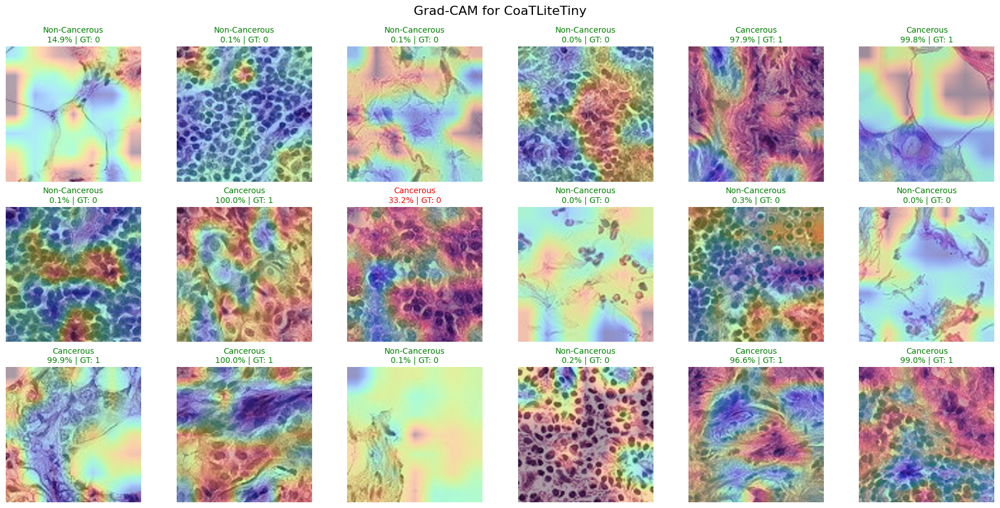

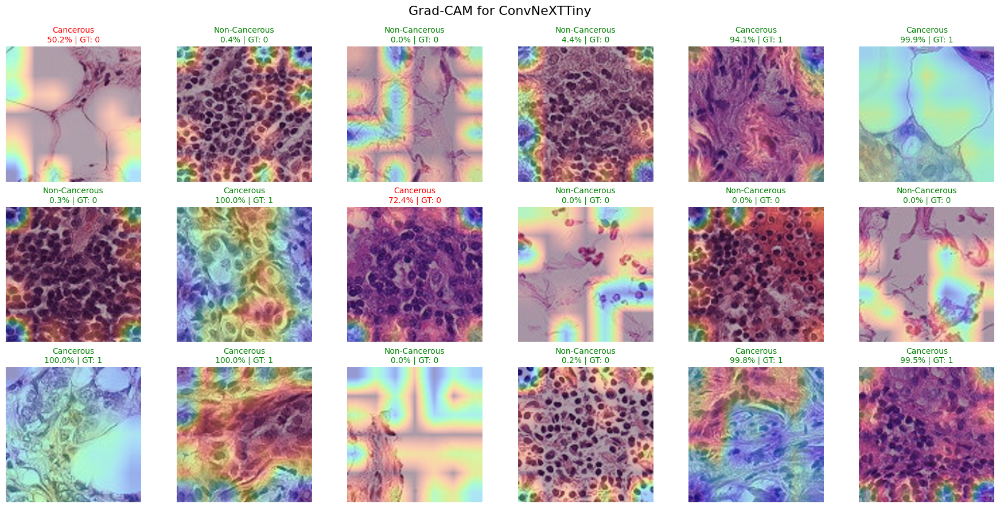

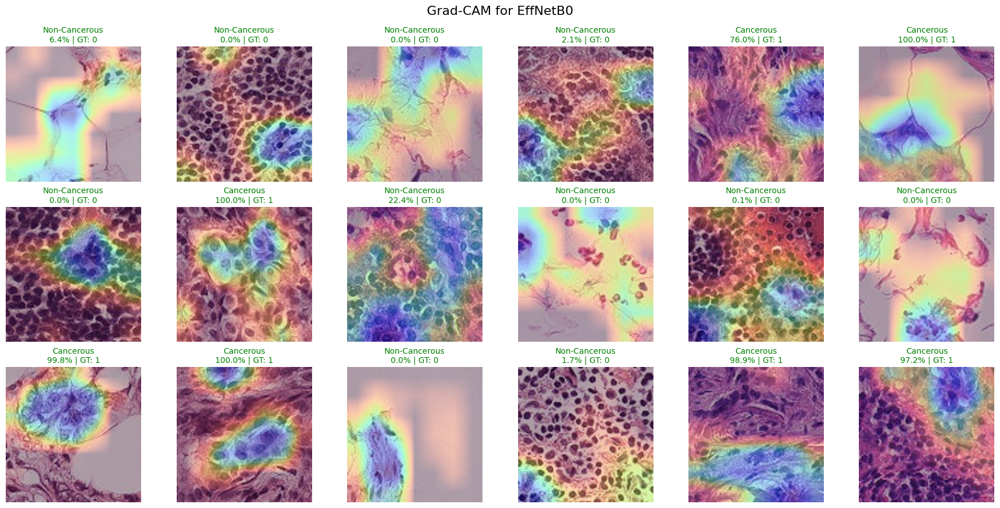

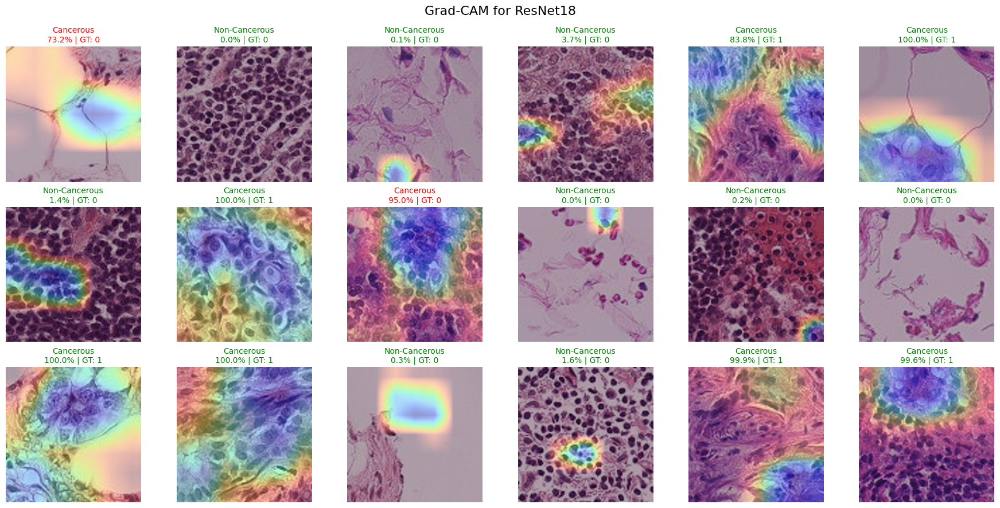

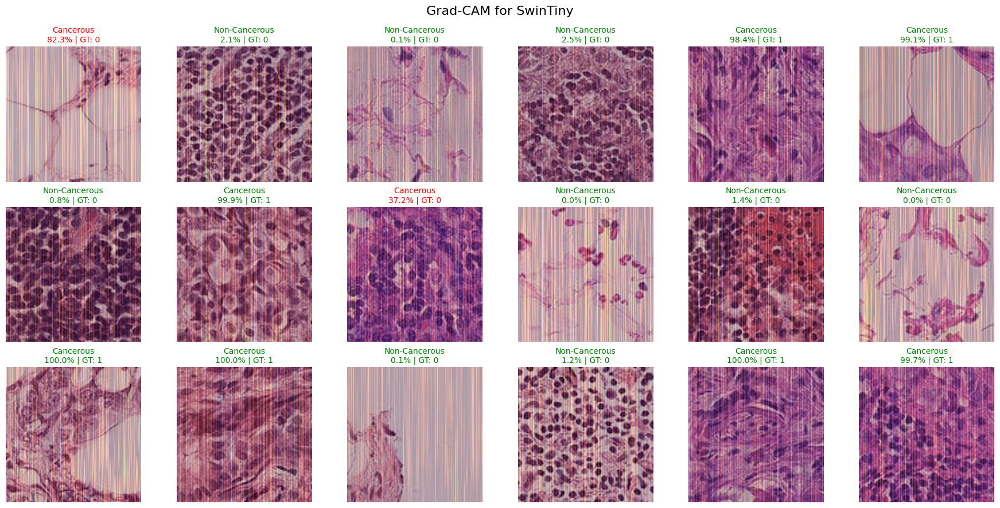

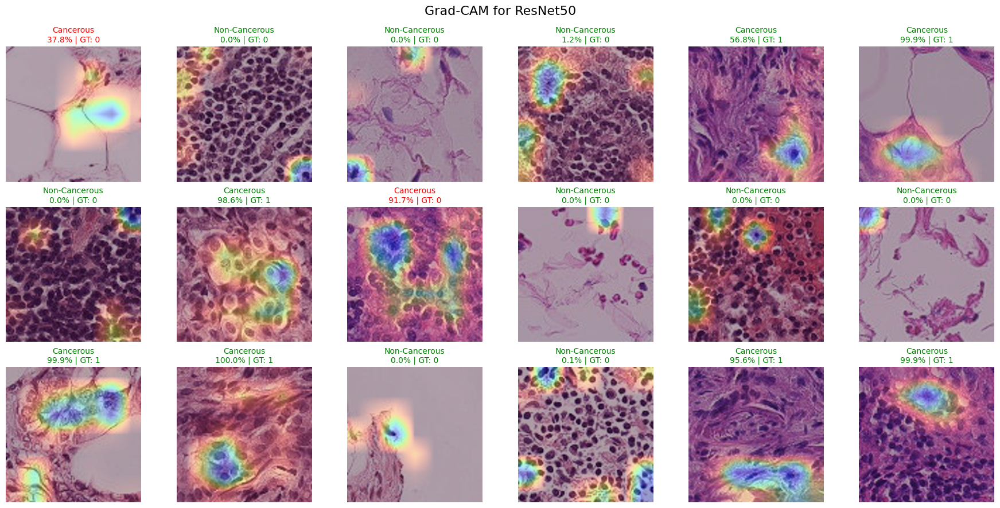

In [30]:
seed = 10
run_gradcam_for_model("CoaTLiteTiny", seed = seed)
run_gradcam_for_model("ConvNeXTTiny", seed = seed)
run_gradcam_for_model("EffNetB0", seed = seed)
run_gradcam_for_model("ResNet18", seed = seed)
run_gradcam_for_model("SwinTiny", seed = seed)
run_gradcam_for_model("ResNet50", seed = seed)

# Ensembling all Models

In [89]:
MODEL_PRIORITY = {
    "CoaTLiteTiny": 4,
    "ConvNeXTTiny": 3,
    "EffNetB0": 2,
    "ResNet18": 1
}
total_weight = sum(MODEL_PRIORITY.values())

NORMALIZED_PRIORITY = {k: v / total_weight for k, v in MODEL_PRIORITY.items()}
MODEL_THRESHOLDS = {k: v["threshold"] for k, v in MODELS.items()}

LOADED_MODELS = {name: MODELS[name]["model"]() for name in MODELS}

from tqdm import tqdm
from torch.nn.functional import sigmoid

all_preds = []

for idx, row in tqdm(df.iterrows(), total=len(df), desc="Ensembling"):
    image_tensor, label = get_image_tensor_and_label(row)

    result_row = {"filename": row["filename"], "label": label}

    for model_name, model in LOADED_MODELS.items():
        with torch.no_grad():
            output = model(image_tensor)
            prob = sigmoid(output).item()
            result_row[model_name] = prob

    all_preds.append(result_row)

ensemble_df = pd.DataFrame(all_preds)

def priority_soft_vote(row):
    vote_sum = 0
    total_weight = 0

    for model in MODEL_PRIORITY:
        prob = row[model]
        threshold = MODEL_THRESHOLDS[model]
        weight = NORMALIZED_PRIORITY[model]
        binary = 1 if prob >= threshold else 0

        vote_sum += binary * weight
        total_weight += weight

    final_vote = 1 if vote_sum >= 0.5 else 0
    return final_vote, vote_sum

ensemble_df[["ensemble_pred", "vote_score"]] = ensemble_df.apply(
    lambda row: pd.Series(priority_soft_vote(row)), axis=1
)


Ensembling: 100%|██████████| 22003/22003 [12:02<00:00, 30.43it/s]


In [88]:
df = pd.read_csv(CSV_PATH)

LOADED_MODELS = {name: config["model"]() for name, config in MODELS.items()}
MODEL_THRESHOLDS = {name: config["threshold"] for name, config in MODELS.items()}

def evaluate_model(model, threshold, model_name):
    all_preds, all_probs, all_labels = [], [], []

    for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Evaluating {model_name}"):
        image_tensor, label = get_image_tensor_and_label(row)
        with torch.no_grad():
            output = model(image_tensor)
            prob = sigmoid(output).item()
            pred = 1 if prob >= threshold else 0

        all_probs.append(prob)
        all_preds.append(pred)
        all_labels.append(label)

    print(f"\n📊 {model_name} (Threshold: {threshold:.2f})")
    print(classification_report(all_labels, all_preds, digits=4))
    print("Confusion Matrix:\n", confusion_matrix(all_labels, all_preds))

    return {
        "probs": all_probs,
        "preds": all_preds,
        "labels": all_labels
    }

# Run for all models
model_results = {}

for model_name, model in LOADED_MODELS.items():
    threshold = MODEL_THRESHOLDS[model_name]
    result = evaluate_model(model, threshold, model_name)
    model_results[model_name] = result

Evaluating ResNet18: 100%|██████████| 22003/22003 [01:07<00:00, 324.03it/s]



📊 ResNet18 (Threshold: 0.28)
              precision    recall  f1-score   support

           0     0.9737    0.9653    0.9695     13191
           1     0.9487    0.9610    0.9548      8812

    accuracy                         0.9636     22003
   macro avg     0.9612    0.9631    0.9621     22003
weighted avg     0.9637    0.9636    0.9636     22003

Confusion Matrix:
 [[12733   458]
 [  344  8468]]


Evaluating ResNet50: 100%|██████████| 22003/22003 [02:06<00:00, 173.30it/s]



📊 ResNet50 (Threshold: 0.29)
              precision    recall  f1-score   support

           0     0.9538    0.9613    0.9575     13191
           1     0.9413    0.9303    0.9358      8812

    accuracy                         0.9489     22003
   macro avg     0.9476    0.9458    0.9467     22003
weighted avg     0.9488    0.9489    0.9488     22003

Confusion Matrix:
 [[12680   511]
 [  614  8198]]


Evaluating EffNetB0: 100%|██████████| 22003/22003 [02:40<00:00, 136.97it/s]



📊 EffNetB0 (Threshold: 0.25)
              precision    recall  f1-score   support

           0     0.9709    0.9565    0.9636     13191
           1     0.9363    0.9571    0.9466      8812

    accuracy                         0.9567     22003
   macro avg     0.9536    0.9568    0.9551     22003
weighted avg     0.9570    0.9567    0.9568     22003

Confusion Matrix:
 [[12617   574]
 [  378  8434]]


Evaluating CoaTLiteTiny: 100%|██████████| 22003/22003 [02:52<00:00, 127.45it/s]



📊 CoaTLiteTiny (Threshold: 0.19)
              precision    recall  f1-score   support

           0     0.9894    0.9590    0.9739     13191
           1     0.9413    0.9846    0.9624      8812

    accuracy                         0.9692     22003
   macro avg     0.9653    0.9718    0.9682     22003
weighted avg     0.9701    0.9692    0.9693     22003

Confusion Matrix:
 [[12650   541]
 [  136  8676]]


Evaluating SwinTiny: 100%|██████████| 22003/22003 [03:21<00:00, 108.98it/s]



📊 SwinTiny (Threshold: 0.28)
              precision    recall  f1-score   support

           0     0.9816    0.9428    0.9618     13191
           1     0.9192    0.9736    0.9456      8812

    accuracy                         0.9551     22003
   macro avg     0.9504    0.9582    0.9537     22003
weighted avg     0.9566    0.9551    0.9553     22003

Confusion Matrix:
 [[12437   754]
 [  233  8579]]


Evaluating ConvNeXTTiny: 100%|██████████| 22003/22003 [02:03<00:00, 178.80it/s]


📊 ConvNeXTTiny (Threshold: 0.20)
              precision    recall  f1-score   support

           0     0.9862    0.9522    0.9689     13191
           1     0.9319    0.9800    0.9554      8812

    accuracy                         0.9633     22003
   macro avg     0.9590    0.9661    0.9621     22003
weighted avg     0.9644    0.9633    0.9635     22003

Confusion Matrix:
 [[12560   631]
 [  176  8636]]


In [ ]:
print(classification_report(
    ensemble_df["label"], ensemble_df["ensemble_pred"], digits=4
))

              precision    recall  f1-score   support

           0     0.9900    0.9687    0.9792     13191
           1     0.9546    0.9854    0.9697      8812

    accuracy                         0.9754     22003
   macro avg     0.9723    0.9770    0.9745     22003
weighted avg     0.9758    0.9754    0.9754     22003



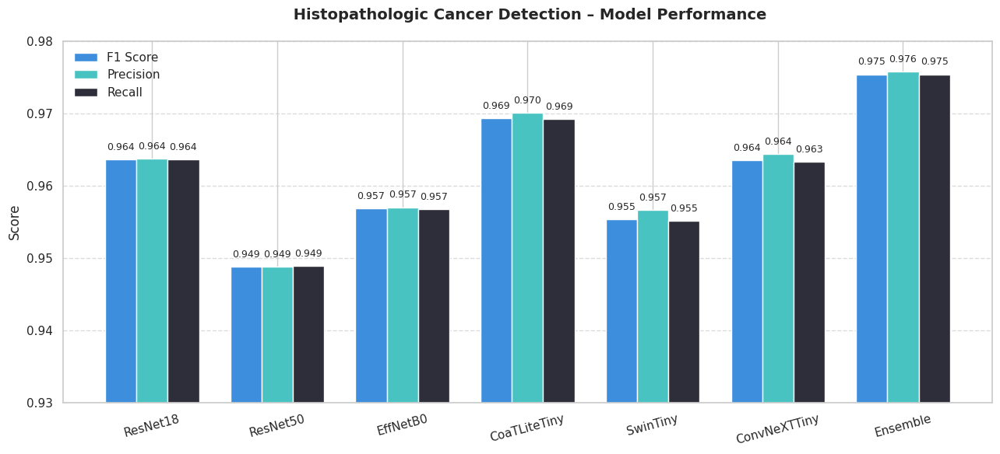

In [56]:
model_names = ["ResNet18", "ResNet50", "EffNetB0", "CoaTLiteTiny", "SwinTiny", "ConvNeXTTiny", "Ensemble"]
f1_scores =     [0.9636,     0.9488,     0.9568,     0.9693,        0.9553,     0.9635,         0.9754]
precisions =    [0.9637,     0.9488,     0.9570,     0.9701,        0.9566,     0.9644,         0.9758]
recalls =       [0.9636,     0.9489,     0.9567,     0.9692,        0.9551,     0.9633,         0.9754]

# Setup
plt.figure(figsize=(13, 6))
sns.set(style="whitegrid")
bar_width = 0.25
x = np.arange(len(model_names))

colors = ["#3E8EDE", "#49C3C1", "#2E2E3A"] 

# Plotting
plt.bar(x - bar_width, f1_scores, width=bar_width, label="F1 Score", color=colors[0])
plt.bar(x, precisions, width=bar_width, label="Precision", color=colors[1])
plt.bar(x + bar_width, recalls, width=bar_width, label="Recall", color=colors[2])

# Annotate values on bars
for i in range(len(model_names)):
    for j, val in enumerate([f1_scores, precisions, recalls]):
        plt.text(i - bar_width + j*bar_width, val[i] + 0.001, f"{val[i]:.3f}", ha='center', va='bottom', fontsize=9)

# Formatting
plt.xticks(x, model_names, rotation=15, fontsize=11)
plt.ylim(0.93, 0.98)
plt.ylabel("Score", fontsize=12)
plt.title(" Histopathologic Cancer Detection – Model Performance", fontsize=14, weight='bold', pad=20)
plt.legend(frameon=False, fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


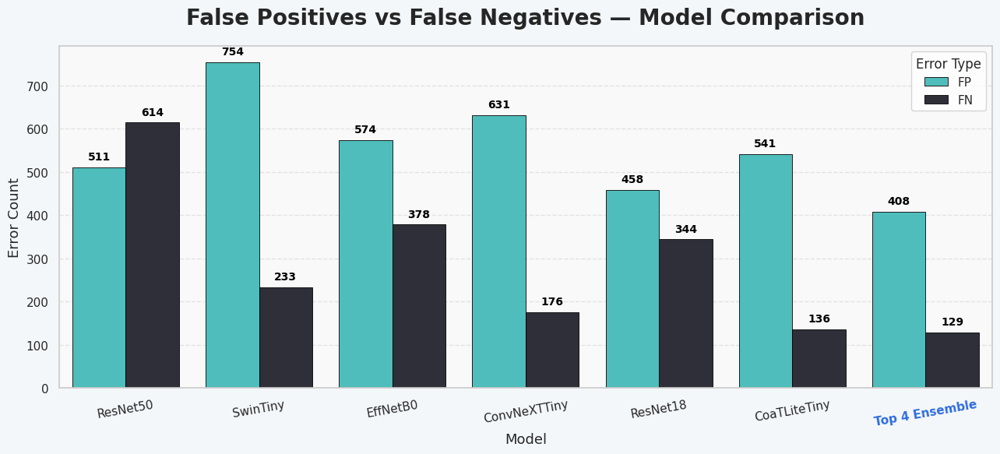

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data
model_errors = [
    {"model": "ResNet18",       "FP": 458, "FN": 344},
    {"model": "ResNet50",       "FP": 511, "FN": 614},
    {"model": "EffNetB0",       "FP": 574, "FN": 378},
    {"model": "CoaTLiteTiny",   "FP": 541, "FN": 136},
    {"model": "SwinTiny",       "FP": 754, "FN": 233},
    {"model": "ConvNeXTTiny",   "FP": 631, "FN": 176},
    {"model": "Top 4 Ensemble", "FP": 408, "FN": 129}
]

# DataFrame
df = pd.DataFrame(model_errors)
df["Total Error"] = df["FP"] + df["FN"]
df = df.sort_values("Total Error", ascending=False)
df = df.drop(columns="Total Error")
df_melted = df.melt(id_vars="model", value_vars=["FP", "FN"],
                    var_name="Error Type", value_name="Count")

# Theme and Color
sns.set_theme(style="whitegrid")
plt.figure(figsize=(13, 6))
palette = {
    "FP": "#49C3C1",  # Coral red
    "FN": "#2E2E3A"   # Sky blue
}

# Barplot with saturation, rounded edges, and edgecolor
bar = sns.barplot(
    data=df_melted,
    x="model", y="Count", hue="Error Type",
    palette=palette,
    edgecolor="black", linewidth=0.6,
    saturation=0.9
)

# Annotate each bar
for p in bar.patches:
    height = p.get_height()
    if height > 0:
        bar.annotate(
            f'{int(height)}',
            (p.get_x() + p.get_width() / 2., height + 12),
            ha='center', va='bottom',
            fontsize=10, fontweight='bold', color='black'
        )

# Highlight ensemble with background glow
highlight_model = "Top 4 Ensemble"
for label in bar.get_xticklabels():
    if label.get_text() == highlight_model:
        label.set_fontweight("bold")
        label.set_color("#2d6cdf")
        label.set_fontsize(12)

# Title & Styling
plt.title("False Positives vs False Negatives — Model Comparison", fontsize=20, weight='bold', pad=20)
plt.xlabel("Model", fontsize=13)
plt.ylabel("Error Count", fontsize=13)
plt.xticks(rotation=10, fontsize=11)
plt.yticks(fontsize=11)
plt.legend(title="Error Type", title_fontsize=12, fontsize=11)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()

# Subtle background
plt.gca().set_facecolor('#f9f9f9')
plt.gcf().patch.set_facecolor('#f4f7fa')

plt.show()
